In [1]:
import os, sys, glob

import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def compute_new_objects(current_image, background):
    current_gray = cv2.cvtColor(current_image, cv2.COLOR_BGR2GRAY)
    current_gray = cv2.GaussianBlur(current_gray, (5, 5), 0)
    background = cv2.GaussianBlur(background, (5, 5), 0)
    diff = cv2.absdiff(current_gray, background)
    _, mask = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel=np.ones((11, 11), dtype=np.uint8))
    contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours, hierarchy

def get_median_pixels(img_dir):
    images = glob.glob(f"{img_dir}/*.jpg")
    image_arrays = [cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2GRAY) for image in images]
    pixel_medians = np.median(image_arrays, axis=0).astype(np.uint8)
    return pixel_medians

median_img = get_median_pixels("train/Task1")

In [3]:
def find_flags(path):
    image = cv2.imread(path)
    # Convert the image to HSV
    hsv_image = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2HSV)
    # Define the color range for red, white, and blue in HSV
    lower_red = np.array([0, 50, 50])
    upper_red = np.array([10, 255, 255])

    # lower_white = np.array([100, 0, 200])
    # upper_white = np.array([180, 50, 255])

    lower_blue = np.array([110, 50, 50])
    upper_blue = np.array([130, 255, 255])

    red_mask = cv2.inRange(hsv_image, lower_red, upper_red)

    blue_mask = cv2.inRange(hsv_image, lower_blue, upper_blue)

    british_flag_mask = cv2.bitwise_or(red_mask, blue_mask)#cv2.bitwise_or(red_mask, cv2.bitwise_or(white_mask, blue_mask))

    kernel_size = 9  # Adjust the size according to your requirements
    kernel = np.ones((kernel_size, kernel_size), np.uint8)

    # british_flag_mask = cv2.morphologyEx(british_flag_mask, cv2.MORPH_OPEN, kernel=np.ones((5, 5), dtype=np.uint8))
    british_flag_mask = cv2.dilate(british_flag_mask, kernel, iterations=3)
    british_flag_mask = cv2.erode(british_flag_mask, kernel, iterations=3)

    contours, _ = cv2.findContours(british_flag_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


    arrow_flags = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if len(arrow_flags)>2 or area<19_000:
            continue
        # arrow_flags.append(cv2.fitEllipse(contour))
        arrow_flags.append(cv2.boundingRect(contour))

    # ret_img = image.copy()
    # for ellipse in arrow_flags:
    #     ret_img = cv2.ellipse(ret_img, ellipse, (0, 255, 0), 5)
    #     center, _ = ellipse[:2]
    #     center = (int(center[0]), int(center[1]))
    #     cv2.circle(ret_img, center, 10, (0, 255, 0), -1)

    # for box in arrow_flags:
    #     x, y, w, h = box
    #     cnt_box = image[y:y+h, x:x+w, :].copy()
    #     cnt_box = detect_parallel_lines(cnt_box)

    #     plt.figure(figsize=(10,10))
    #     plt.imshow(cnt_box)
    return arrow_flags
    plt.figure(figsize=(15,15))
    plt.imshow(ret_img)
    plt.show()

for i in range(1, 3):
    path = f'train/Task1/{ "0" + str(i) if i<10 else i}.jpg'
    print(path)
    x = find_flags(path)
    print(len(x))



train/Task1/01.jpg
3
train/Task1/02.jpg
2


In [4]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist

# def cluster_arrows(image):
    

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


train/Task1/01.jpg
3
[4, 4, 6]


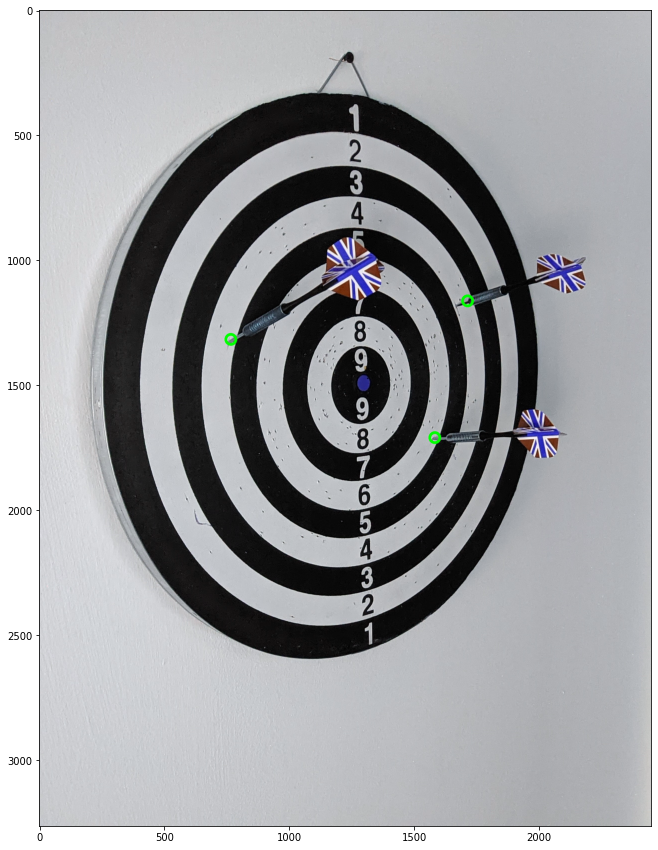

train/Task1/02.jpg
2
[6, 8]


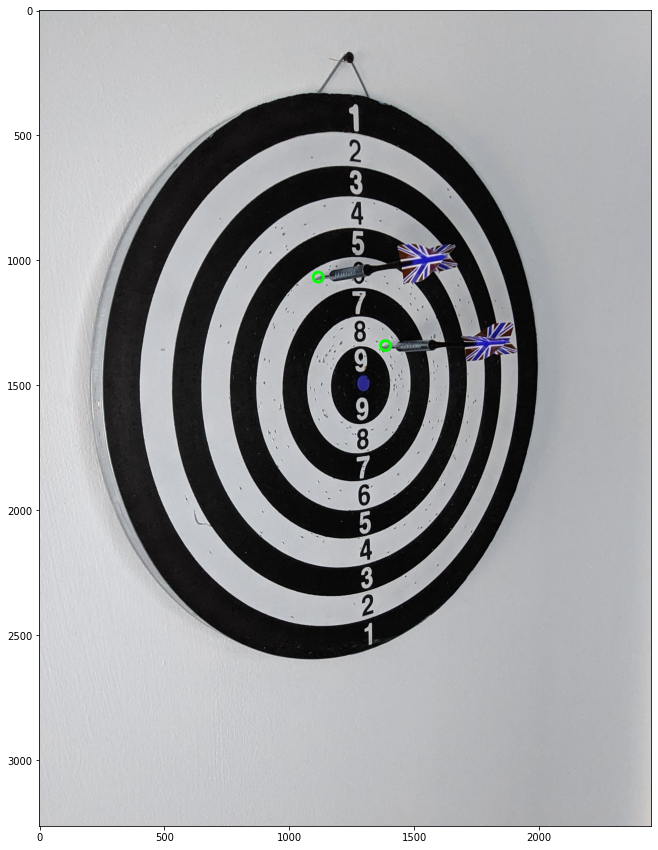

train/Task1/03.jpg
3
[6, 6, 8]


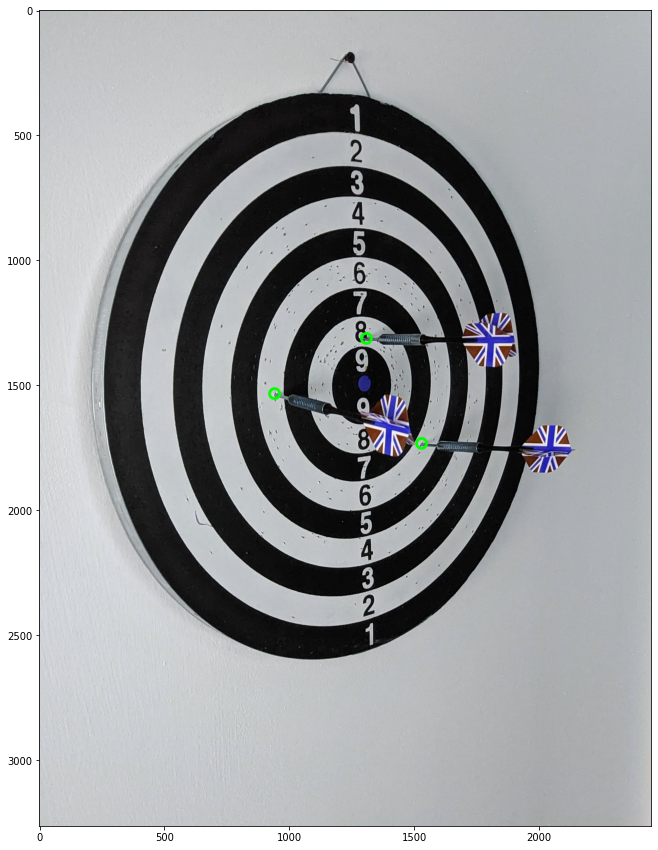

train/Task1/04.jpg
2
[6, 6]


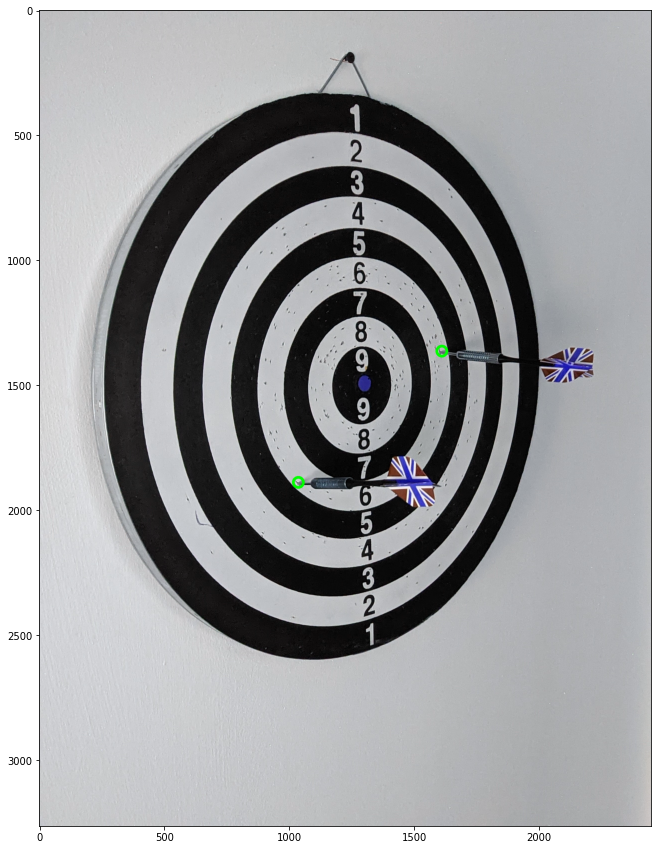

train/Task1/05.jpg
1
[2]


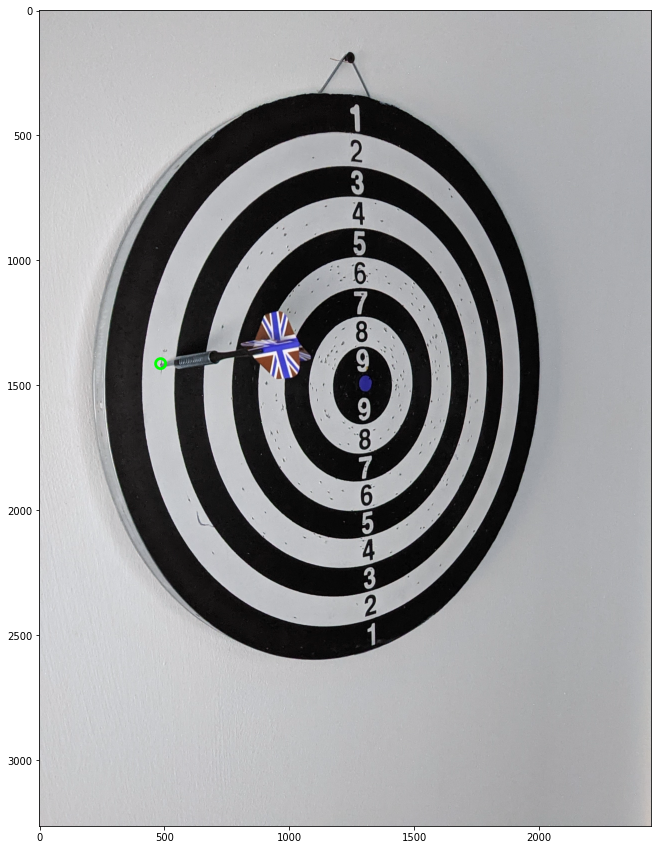

train/Task1/06.jpg
2
[6, 9]


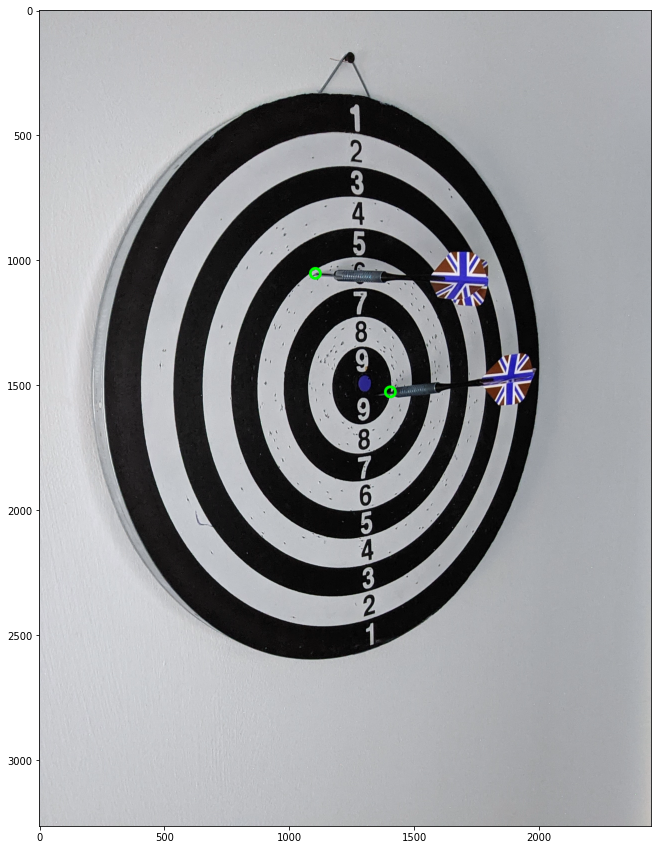

train/Task1/07.jpg
1
[6]


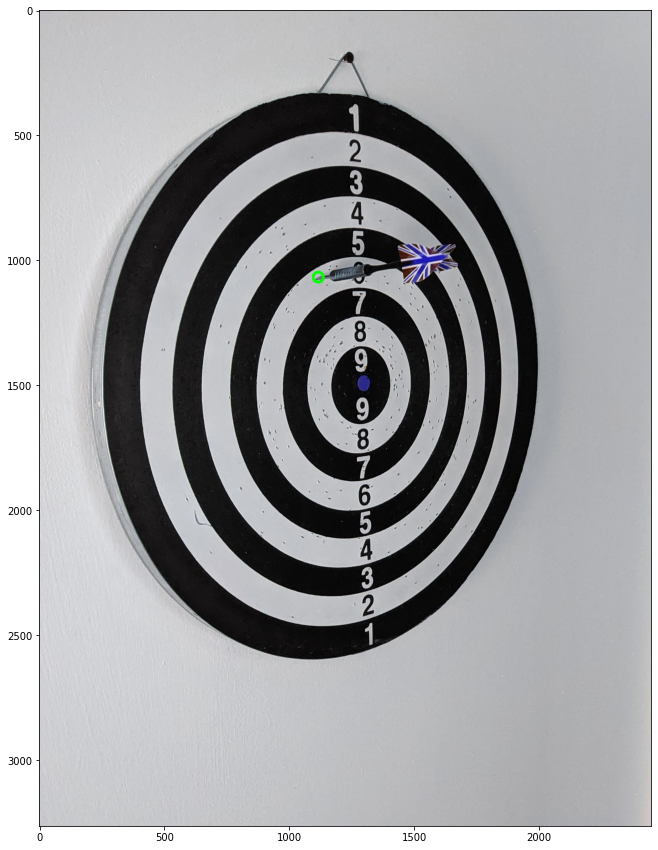

train/Task1/08.jpg
1
[6]


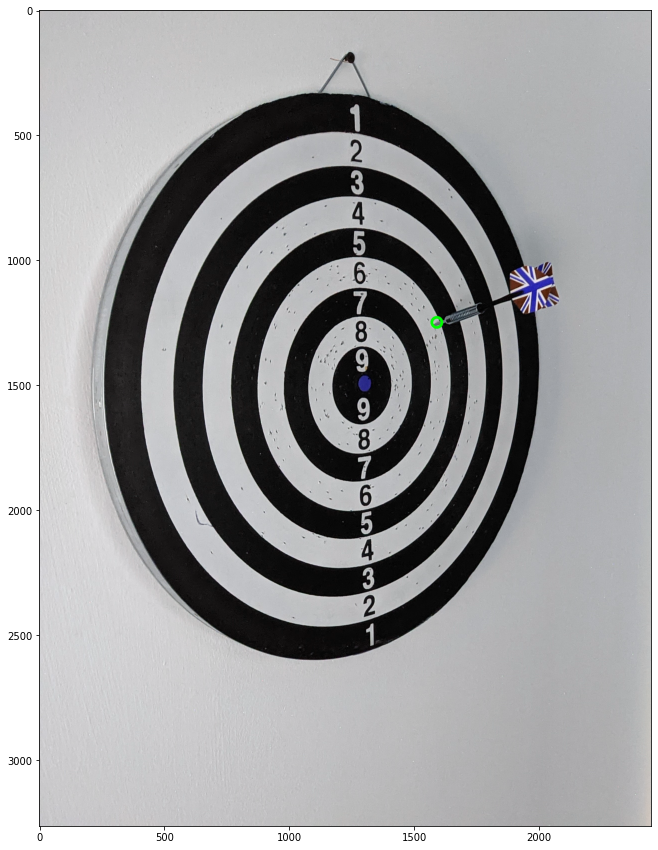

train/Task1/09.jpg
2
[4, 9]


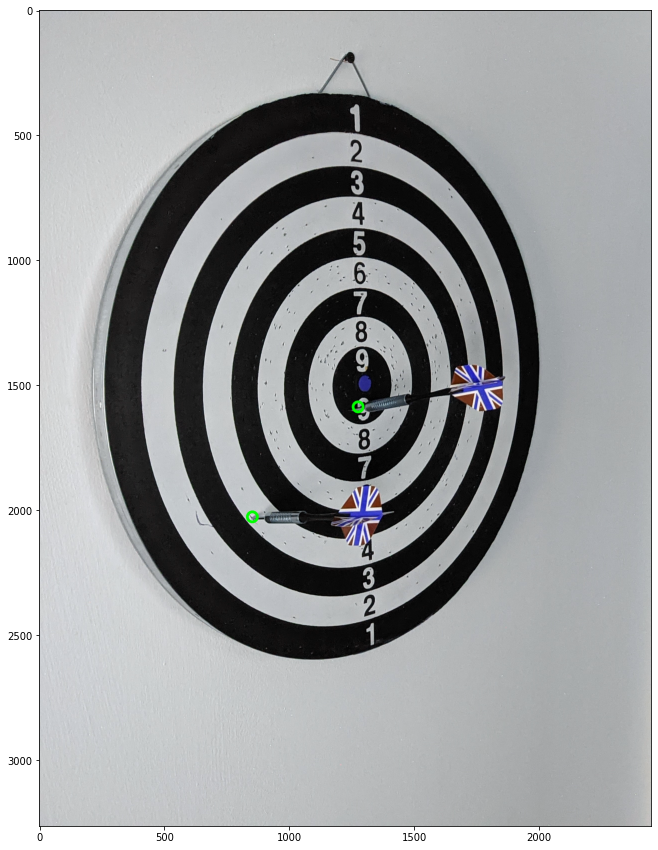

train/Task1/10.jpg
2
[4, 6]


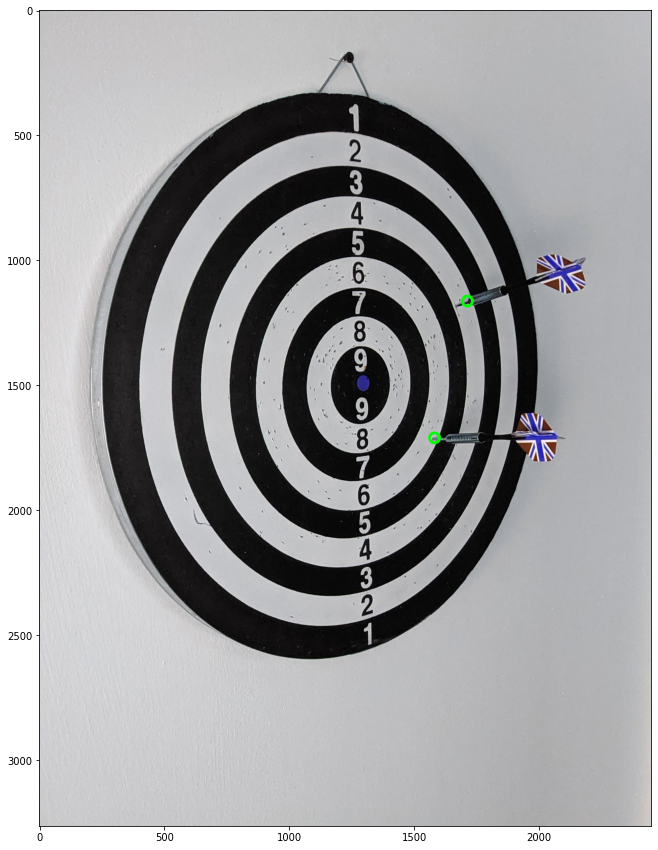

train/Task1/11.jpg
3
[6, 6, 7]


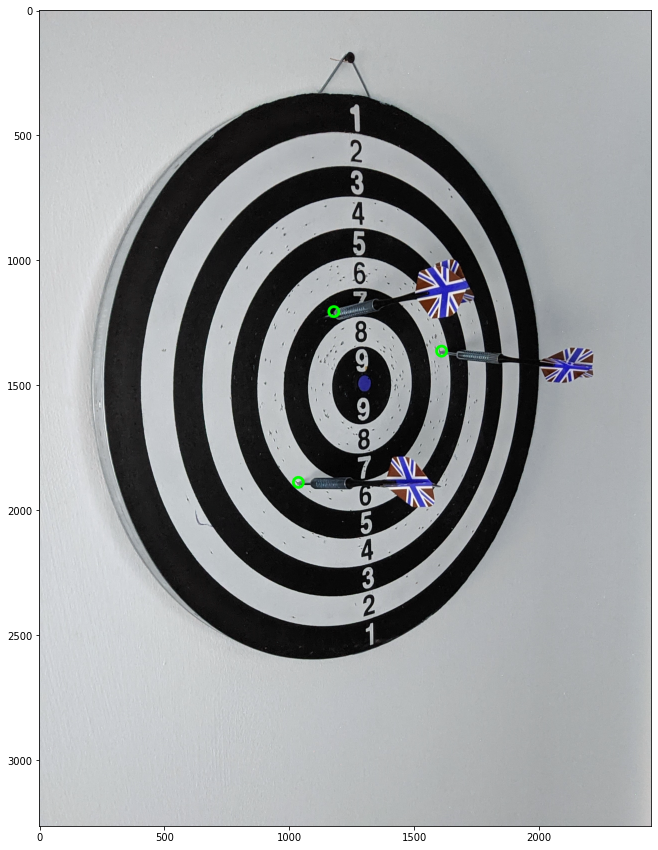

train/Task1/12.jpg
1
[8]


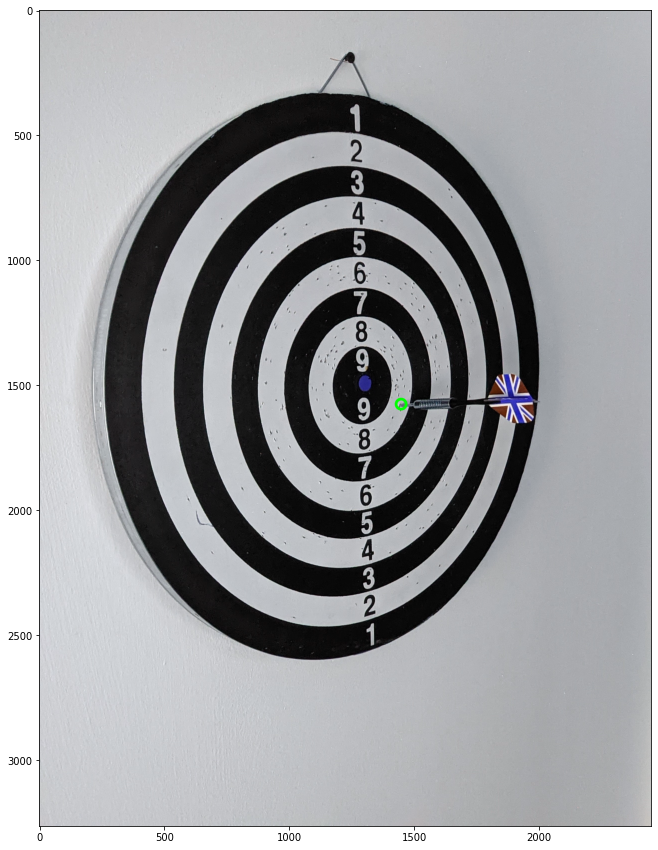

train/Task1/13.jpg
3
[2, 4, 9]


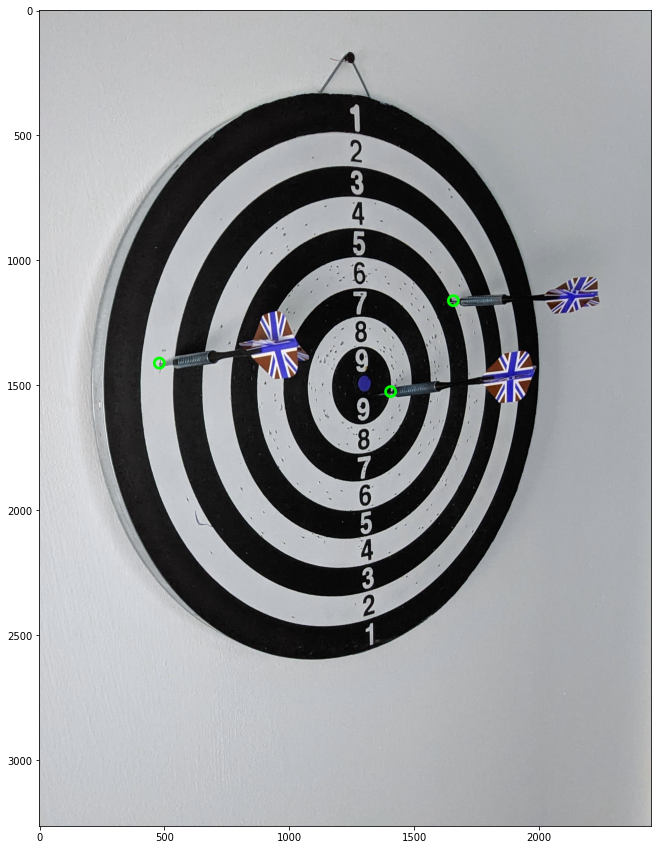

train/Task1/14.jpg
3
[5, 6, 6]


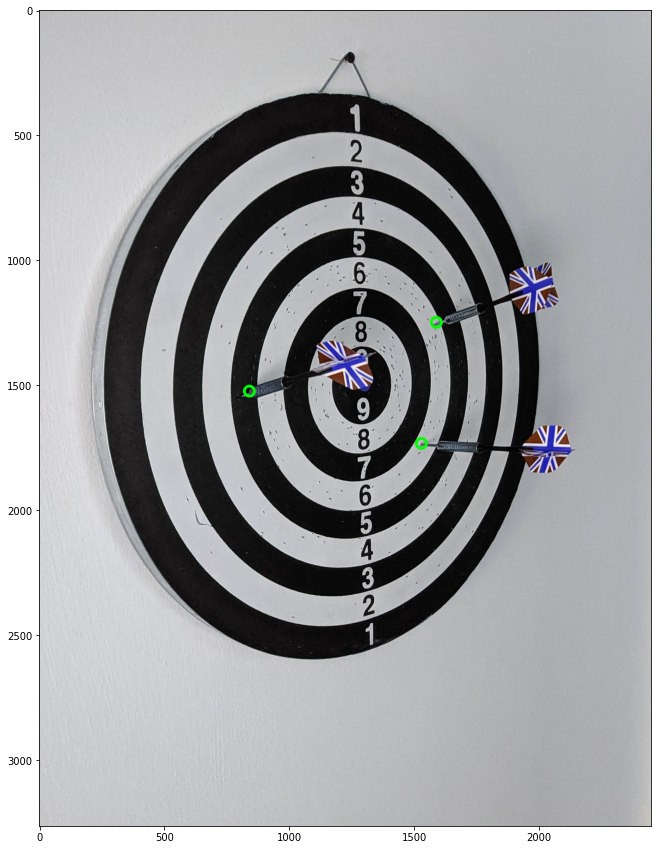

train/Task1/15.jpg
2
[4, 7]


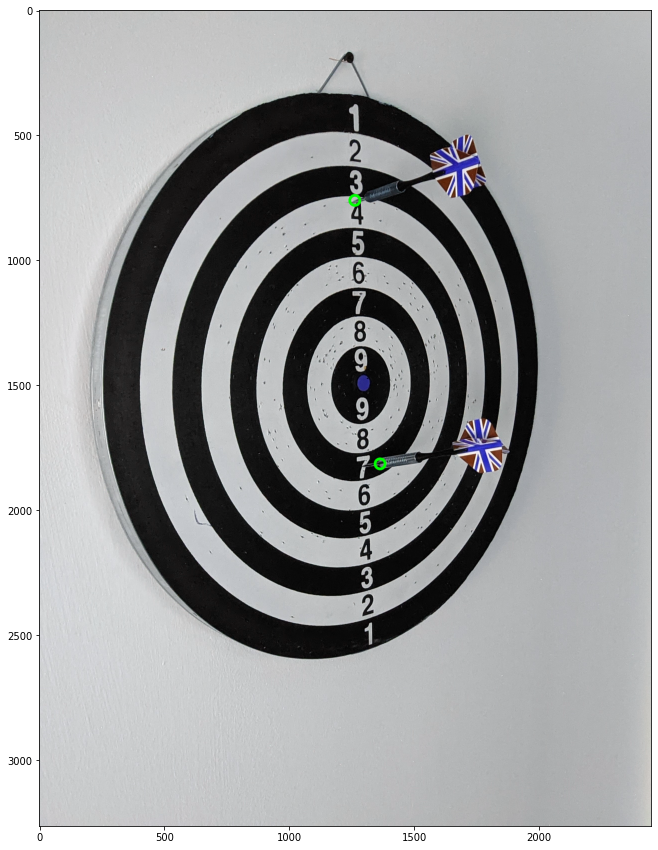

train/Task1/16.jpg
1
[7]


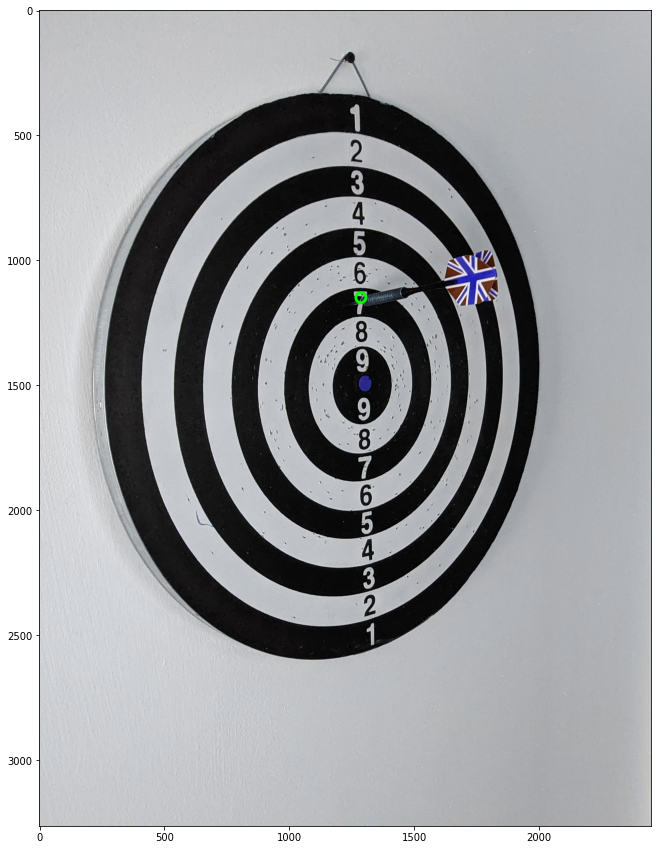

train/Task1/17.jpg
3
[6, 6, 7]


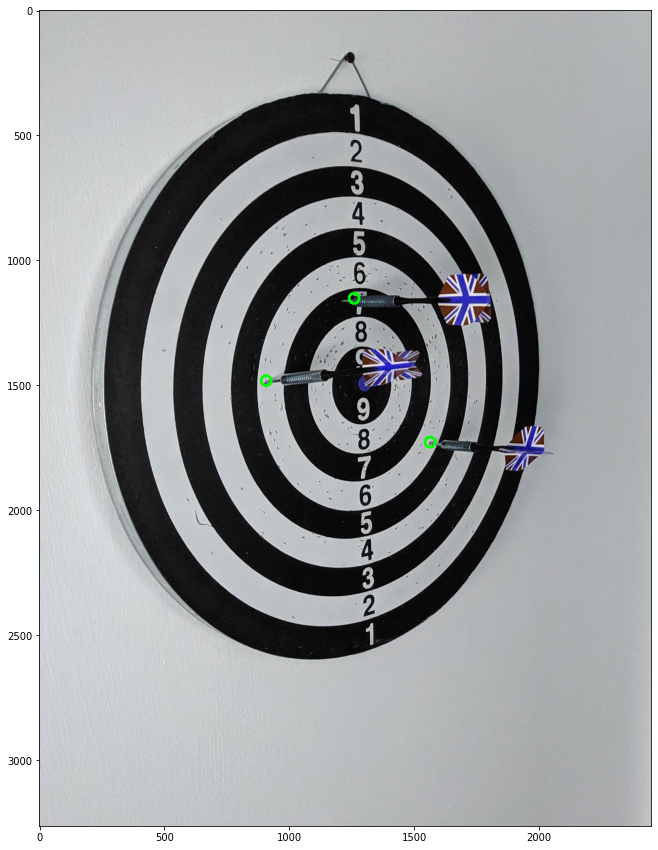

train/Task1/18.jpg
3
[4, 5, 6]


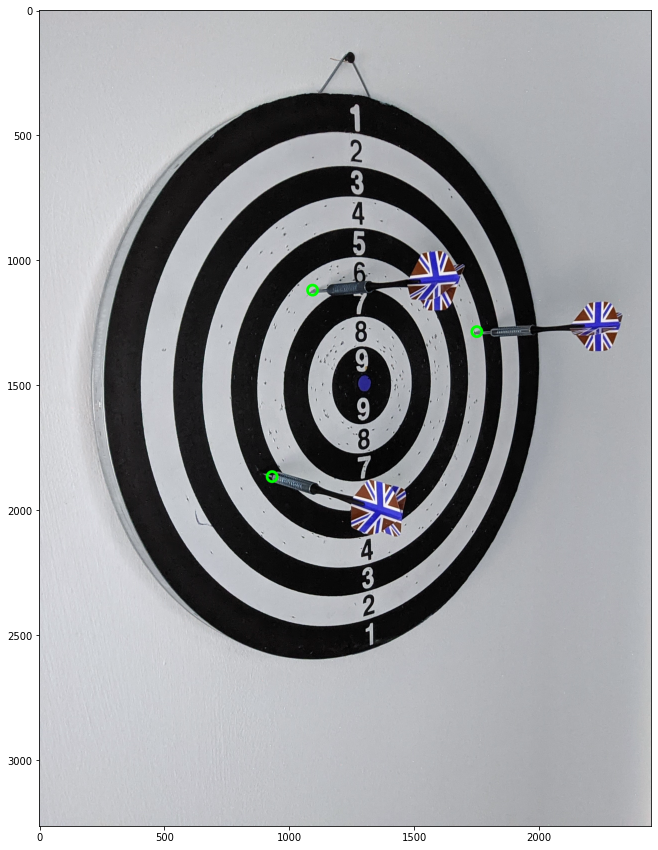

train/Task1/19.jpg
1
[9]


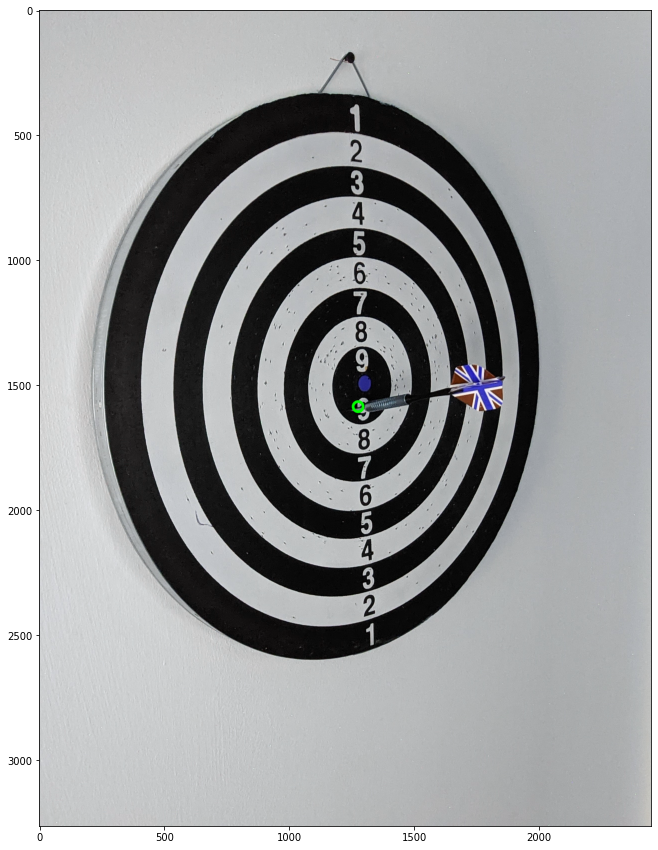

train/Task1/20.jpg
3
[4, 5, 7]


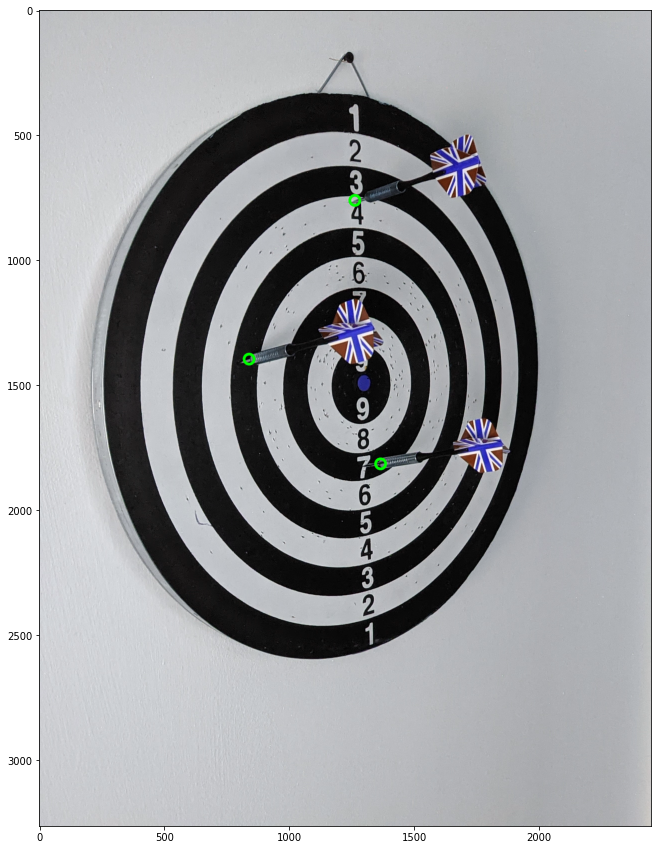

train/Task1/21.jpg
1
[4]


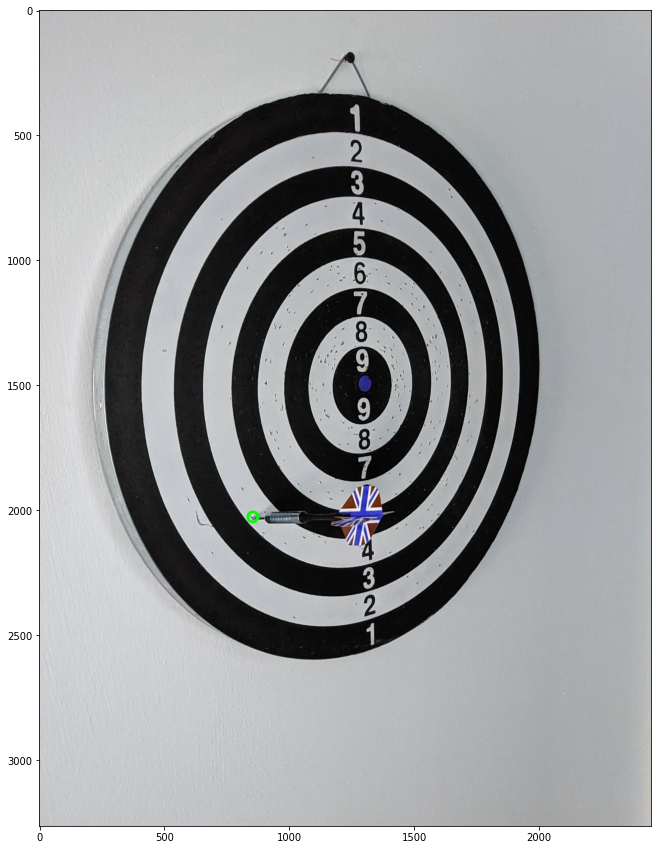

train/Task1/22.jpg
2
[4, 9]


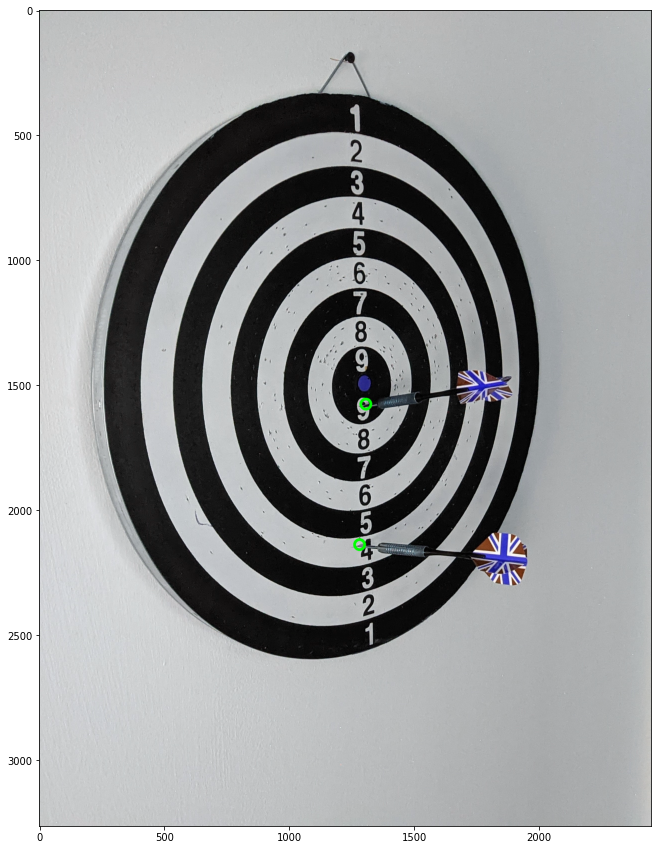

train/Task1/23.jpg
2
[7, 8]


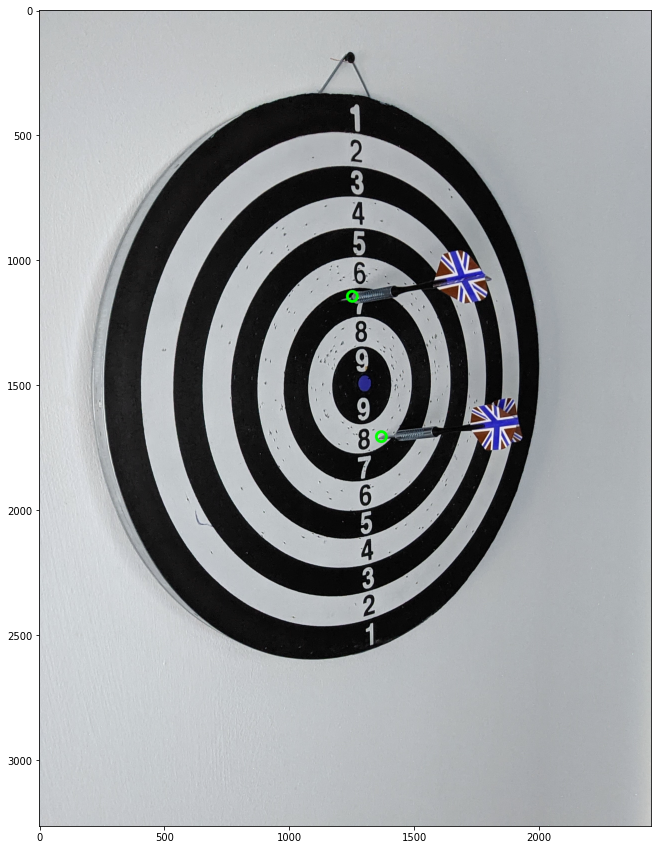

train/Task1/24.jpg
2
[6, 8]


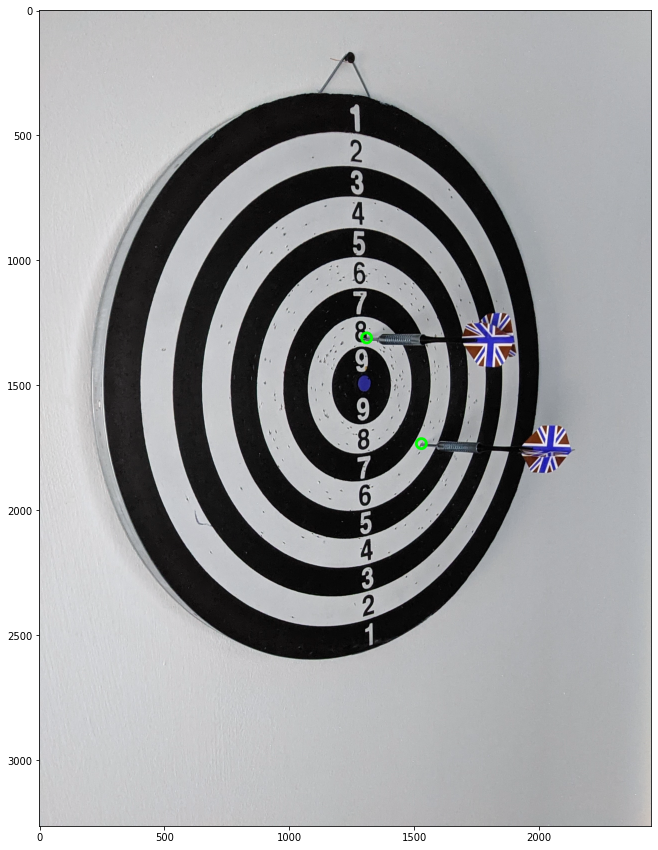

train/Task1/25.jpg
1
[5]


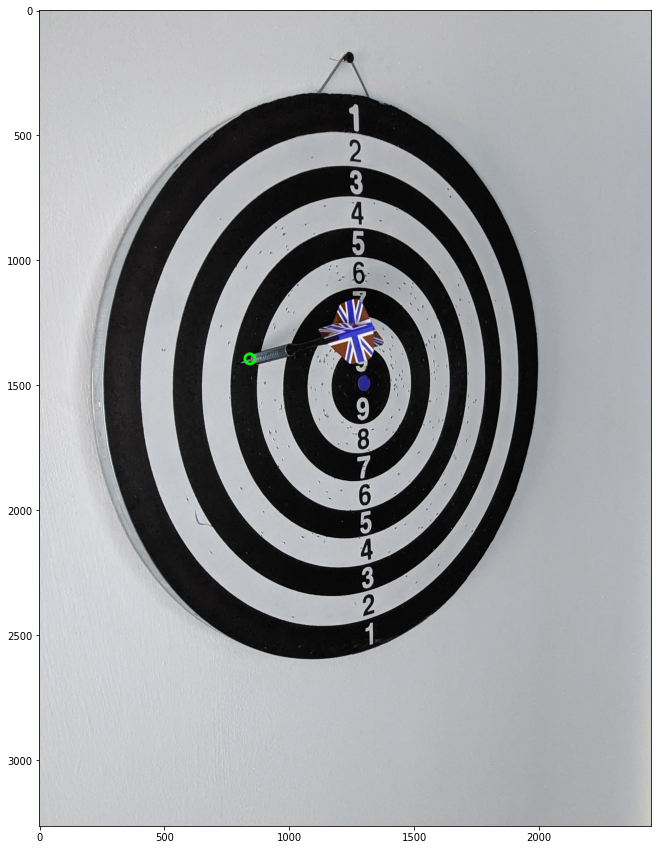

In [125]:
import cv2
import numpy as np


def get_contour_centroid(contour):
    eps = 1e-10
    moments = cv2.moments(contour)
    centroid_x = int(moments["m10"] / (moments["m00"] + eps))
    centroid_y = int(moments["m01"] / (moments["m00"] + eps))
    return [centroid_x, centroid_y]



def cluster_contours(contours, n_clusters):
    centroids = np.array([get_contour_centroid(contour) for contour in contours])
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(centroids)
    labels = kmeans.labels_
    clustered_contours = {}

    for label in range(n_clusters):
        indices = np.where(labels == label)[0]
        clustered_contours[label] = [contours[idx] for idx in indices]
    return clustered_contours


def remove_points_inside_boxes(contours, bound_rects):
    filtered_contours = []
    for contour in contours:
        points_inside = []
        for point in contour:
            is_inside = False
            for rect in bound_rects:
                x, y, w, h = rect
                if x <= point[0][0] <= x + w and y <= point[0][1] <= y + h:
                    is_inside = True
                    break
            if not is_inside:
                points_inside.append(point)
        if len(points_inside) > 0:
            filtered_contours.append(np.array(points_inside))
    return filtered_contours


def draw_circle_around_leftmost(contours, image):
    output_image = image.copy()
    for contour_cluster in contours:
        leftmost_point = tuple(contour_cluster[contour_cluster[:, :, 0].argmin()][0])
        cv2.circle(output_image, leftmost_point, 10, (0, 255, 0), 2)
    return output_image


def find_leftmost_point(contour):
    leftmost_point = None
    contour = contour.squeeze()
    min_x = np.min(contour[:, 0])
    if leftmost_point is None or min_x < leftmost_point[0]:
        leftmost_point = (min_x, contour[contour[:, 0].argmin(), 1])
    return leftmost_point

def find_location(tip):
    mask = cv2.imread("mask_task1.png")[:, :, 1]
    mask = np.clip(mask - 100, 0, 255)
    margin = 4
    y, x = tip
    
    sample = mask[x - margin : x + margin, y - margin : y + margin].flatten()
    unique_elements, element_counts = np.unique(sample, return_counts=True)

    most_common_index = np.argmax(element_counts)
    return unique_elements[most_common_index]

for i in range(1,26):
    path = f"train/Task1/{i if i>9 else f'0{i}'}.jpg"
    print(path)
    img = cv2.imread(path)

    contours, hierarchy = compute_new_objects(img, median_img)

    flags = find_flags(path)
    n_clusters = len(flags)
    print(n_clusters)

    flags = [ (x-40, y-40, w+40, h+40) for (x,y,w,h) in flags ]

    contours = remove_points_inside_boxes(contours, flags)

    clustered_contours = cluster_contours(contours, n_clusters)
    scores = []

    output_image = np.zeros_like(img, dtype=np.uint8)
    colors = [(0, 0, 255), (0, 255, 0), (255, 0, 0)]  # Define different colors for clusters
    for i, label in enumerate(clustered_contours):


        big_contour =  np.concatenate(clustered_contours[label], axis=0)
        tip = find_leftmost_point(big_contour)
        scores.append(find_location(tip))
        cv2.circle(img, tip, 20, (0, 255, 0), 10)   
    
    print(sorted(scores))
    
    plt.figure(figsize=(15,15))
    plt.imshow(img)
    plt.show()

In [40]:
type(flags[0])

tuple

In [70]:
import json
with open("mask.json", "r") as f:
    mask = json.loads(f.read())

mask = mask["objects"][0]["bitmap"]["data"]
mask

'eJx0XXcgVf0bd0736iJcu1Bdu+w9SrpGskf2CCVbdVFZpXtTaGjZMxqyXUkp0WkqRRpKVrepKS20f99z7nDp/f3zvt57vuvZn+f5Pue8u12cVgryS/Pz8PAI2tpYreLh4e3l4SH0E3jBL28dUmPBv6C4VSsteOq7Zd/w8JB4bK3M3RMC3g883iJjIoon//i7POlV31DsLX2lhzuU8vK9pFxvtORr8iR+ff50O45AJJGpPBCM/kF3YGz/+/PJ39w29Z69Kb8mPyn0bHLYxXqIjTqJl410yvoOcf2E6xbYtL6i5NC9hKXHXvpw/e4pEF5dJzlhxvWTnUB4aV2ml8KGurNnRTj7vlYvq3posq1ZbOok2g5kvfVzX56m6TMq7krnc45AFoAcmyV11A5PHYrWCheGxuOD/wZc0dhiFrqSvQSZtINa4btT/DaNa6w2XBi25ijBQMTxrEtM/pypBxpwYaRfX1s219ghMLZVrPJ7StfZwnPVezhPEGfI0eAdlWvkPTDyxPP1HsVpq2taJOzZj4guZDeNoEUVVlNjkUSoq+lLaIqrPfl+nWdptRyb4gyVsipJLTE9eQ4LyAwZqEvvViqyDOo6m5yS4sh+0ONFdqvbOK6qwhlK9CV/Ud9kqrySIQxlLhHYwV6hLBVwID2712aKJ7up1r6HyxyyEAjKPDPLZgHnADZKZVW5qppZSpxVXVaSZ9U55arKUazIWR8yDodxxCgPJLvCqWNwSnfERXus1MQrVhHmEHvWyVDDCRzenACMtT/Xtm9KhKshx6bzj6v3IfyQ4xmJzmFz9oaUlWS3D/tLn4hy9CBcsSzi4aLoE6J96mWXzpjwNHBoTlhcVhW6hkt3x3q0mwiAj4vKzknqSMSx+fhVosf9XVFbJx97aCF/eJmBYMBjnKhAeL2S0J0H7Ce7cPq9/LuqxKfUdSEsHfYQhmAJvP4j1YpqZTYBC4AOmvoULJ5SgIs4/Tvq/DBuCX94/WaH1V3s338

In [71]:
from PIL import Image
import cv2
import numpy as np
import io
import base64

mask = base64.b64decode(mask)

# Create an in-memory stream from the bitmap data
stream = io.BytesIO(mask)

# Get the bytes data from the stream
image_data_bytes = stream.getvalue()

# Open the image using Pillow
image = Image.open(io.BytesIO(image_data_bytes))



image.show()

UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x0000017790D365E0>

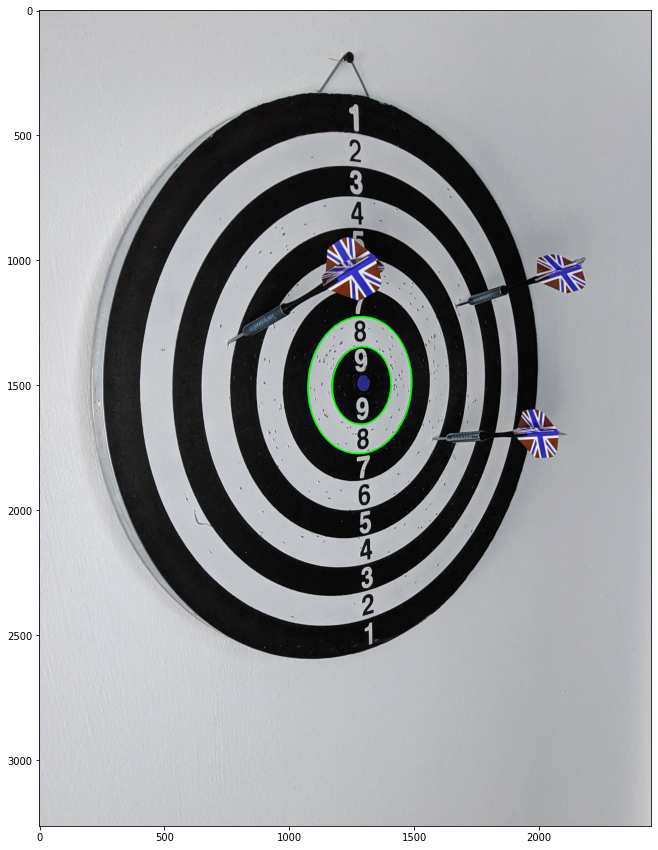

In [83]:
mask = cv2.imread("mask.png")
mask = 1 * (mask[:,:, 1] == 101)
mask = mask.astype(np.uint8)



for i in range(1, 2):    
    path = f"train/Task1/{i if i>9 else f'0{i}'}.jpg"
    img = cv2.imread(path)

    for i in range(8,10):
        mask = cv2.imread("mask.png")
        cnt_num = 100 + i
        # print(cnt_num)
        mask = 1 * (mask[:,:, 1] == cnt_num)
        mask = mask.astype(np.uint8)
        
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(img, contours, -1, (0, 255, 0), 5)

    plt.figure(figsize=(15,15))
    plt.imshow(img)
    plt.show()

In [93]:
mask = cv2.imread("mask.png")[:, :, 1]

score_mask = np.zeros_like(mask)


for cnt_num in range(101, 110):

    cnt_mask = 1 * (mask == cnt_num)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(score_mask, contours, -1, (cnt_num-1), -1)

# for i in range


# for i in range(1, 2):    
#     path = f"train/Task1/{i if i>9 else f'0{i}'}.jpg"
#     img = cv2.imread(path)

#     for i in range(8,10):
#         mask = cv2.imread("mask.png")
#         cnt_num = 100 + i
#         # print(cnt_num)
#         mask = 1 * (mask[:,:, 1] == cnt_num)
#         mask = mask.astype(np.uint8)
        
#         contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#         cv2.drawContours(img, contours, -1, (0, 255, 0), 5)

#     plt.figure(figsize=(15,15))
#     plt.imshow(img)
#     plt.show()

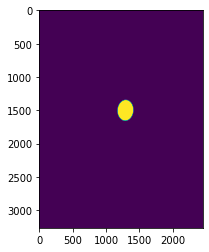

In [105]:
mask = cv2.imread("mask.png")[:, :, 1]

plt.imshow( 1 * (mask == 109) )

In [94]:
np.unique(score_mask.flatten())

array([108], dtype=uint8)

True

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]])

In [116]:
mask = median_img.copy()
mask = cv2.medianBlur(mask, 21)
cv2.imwrite("mask10.png", 255 * (median_img > 30))

True

In [121]:
mask1 = cv2.imread("mask.png")[:, :, 1]
mask2 = cv2.imread("mask10.png")[:, :, 1]
# plt.imshow(1 * (mask2 == 110))

mask1[mask2 == 110] = 110

In [122]:
cv2.imwrite("mask_task1.png", mask1)

True

### BACKUP

In [ ]:
def merge_contours(contours, distance_threshold):
    # Compute the bounding boxes for each contour
    bounding_boxes = [cv2.boundingRect(contour) for contour in contours]

    # Initialize a list to store merged bounding boxes
    merged_boxes = []

    # Merge close bounding boxes
    for i, box in enumerate(bounding_boxes):
        merge = True
        for j in range(i + 1, len(bounding_boxes)):
            # Calculate the centers of the bounding boxes
            center_i = (box[0] + box[2] // 2, box[1] + box[3] // 2)
            center_j = (bounding_boxes[j][0] + bounding_boxes[j][2] // 2, bounding_boxes[j][1] + bounding_boxes[j][3] // 2)

            # Calculate the distance between the centers
            distance = np.linalg.norm(np.array(center_i) - np.array(center_j))

            # Check if the distance is below the threshold
            if distance <= distance_threshold:
                # Merge the bounding boxes
                merge = False
                x = min(box[0], bounding_boxes[j][0])
                y = min(box[1], bounding_boxes[j][1])
                w = max(box[0] + box[2], bounding_boxes[j][0] + bounding_boxes[j][2]) - x
                h = max(box[1] + box[3], bounding_boxes[j][1] + bounding_boxes[j][3]) - y
                merged_boxes.append((x, y, w, h))

        # If no close bounding box found, add it to the merged boxes list
        if merge:
            merged_boxes.append(box)

    return merged_boxes



def find_flag(path):
    image = cv2.imread(path)
    # Convert the image to HSV
    hsv_image = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2HSV)
    # Define the color range for red, white, and blue in HSV
    lower_red = np.array([0, 50, 50])
    upper_red = np.array([10, 255, 255])

    # lower_white = np.array([100, 0, 200])
    # upper_white = np.array([180, 50, 255])

    lower_blue = np.array([110, 50, 50])
    upper_blue = np.array([130, 255, 255])
    # Create masks for red, white, and blue
    red_mask = cv2.inRange(hsv_image, lower_red, upper_red)
    # white_mask = cv2.inRange(hsv_image, lower_white, upper_white)
    blue_mask = cv2.inRange(hsv_image, lower_blue, upper_blue)
    # Combine the masks
    british_flag_mask = cv2.bitwise_or(red_mask, blue_mask)#cv2.bitwise_or(red_mask, cv2.bitwise_or(white_mask, blue_mask))
    # Apply the mask to the original image
    # british_flag_regions = cv2.bitwise_and(image, image, mask=british_flag_mask)
   
   


    # _, mask = cv2.threshold(british_flag_regions, 1, 255, cv2.THRESH_BINARY)
    # ones_mask = np.ones_like(image)

    # # Apply the mask to the original image
    # british_flag_regions = cv2.bitwise_and(ones_mask, image, mask=mask)
    # lower_threshold = np.array([0, 0, 0])  # Define lower threshold for black color
    # upper_threshold = np.array([10, 10, 10])  # Define upper threshold for black color
    # british_flag_regions = cv2.inRange(british_flag_regions, lower_threshold, upper_threshold)



    # contours, _ = cv2.findContours(british_flag_regions, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


    # cv2.drawContours(image, contours, -1, (0, 255, 0), 5)
    

    # british_flag_regions = cv2.morphologyEx(british_flag_regions, cv2.MORPH_OPEN, kernel=np.ones((11, 11), dtype=np.uint8))
    kernel_size = 9  # Adjust the size according to your requirements
    kernel = np.ones((kernel_size, kernel_size), np.uint8)

    # british_flag_mask = cv2.morphologyEx(british_flag_mask, cv2.MORPH_OPEN, kernel=np.ones((5, 5), dtype=np.uint8))
    british_flag_mask = cv2.dilate(british_flag_mask, kernel, iterations=3)
    british_flag_mask = cv2.erode(british_flag_mask, kernel, iterations=3)

    contours, _ = cv2.findContours(british_flag_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros_like(image)

    arrow_flags = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if len(arrow_flags)>2 or area<19_000:
            continue
        
        arrow_flags.append(cv2.boundingRect(contour))

    # result = cv2.bitwise_and(image, mask)
    # british_flag_mask = image * british_flag_mask#cv2.bitwise_and(image, british_flag_mask)   
    # british_flag_mask = cv2.bitwise_and(image, image, mask=british_flag_mask)

    print(len(arrow_flags))
    for box in arrow_flags:
        x, y, w, h = box
        cnt_box = image[y:y+h, x:x+w, :].copy()


        # lines = 
        gray = cv2.cvtColor(cnt_box, cv2.COLOR_BGR2GRAY)
        _, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

        # Find contours in the binary image
        # contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # cv2.drawContours(cnt_box, contours, -1, (0, 255, 0), 2)

        # cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        plt.figure(figsize=(10,10))
        plt.imshow(binary)

    
    
    # cv2.GaussianBlur(british_flag_regions, (51, 51), 0)
    plt.figure(figsize=(15,15))
    plt.imshow(image)#british_flag_mask)#british_flag_regions
    plt.show()

for i in range(1, 25):
    path = f'train/Task1/{ "0" + str(i) if i<10 else i}.jpg'
    print(path)
    find_flag(path)





# TODO: find an algorithm to cluster the regions together